## Environmental Source Apportionment Toolkit (ESAT) Solution Eval


In [1]:
# Notebook imports
import os
import sys
import json
import numpy as np
import pandas as pd

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

#### Code Imports

In [2]:
from esat.data.datahandler import DataHandler
from esat.model.sa import SA
from esat.model.batch_sa import BatchSA
from esat.data.analysis import ModelAnalysis, BatchAnalysis
from esat.metrics import q_loss, qr_loss

#### Synthetic Dataset

Generate a synthetic dataset where the factor profiles and contributions are pre-determined for model output analysis.

In [3]:
seed = 42

syn_factors = 6
syn_features = 40
syn_samples = 200

rng = np.random.default_rng(seed)
syn_factor_profiles = np.zeros(shape=(syn_factors, syn_features))
syn_factor_contributions = rng.random(size=(syn_samples, syn_factors)) * 10
factor_list = list(range(syn_factors))
for i in range(syn_features):
    factor_features_n = rng.integers(1, syn_factors, 1)     # Number of factors which will have a non-zero value in the profile for this feature
    factor_feature_selected = rng.choice(factor_list, size=factor_features_n, replace=False)     # The specific factors which have a non-zero value in the profile for this feature
    for j in factor_feature_selected:
        ij_value = rng.random(size=1)
        syn_factor_profiles[j, i] = ij_value

syn_factor_profiles[syn_factor_profiles == 0.0] = 1e-12

syn_data = np.matmul(syn_factor_contributions, syn_factor_profiles)
noise = syn_data * np.random.normal(loc=0.1, scale=0.05, size=syn_data.shape)
syn_data = np.add(syn_data, noise)

syn_unc_p = np.random.normal(loc=0.05, scale=0.01, size=syn_data.shape)
syn_uncertainty = syn_data * syn_unc_p
syn_uncertainty[syn_uncertainty <= 0.0] = 1e-12

C:\Users\dsmith\AppData\Local\Temp\ipykernel_22420\1408066339.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  syn_factor_profiles[j, i] = ij_value


In [4]:
syn_columns = [f"Feature {i}" for i in range(1, syn_features+1)]
syn_input_df = pd.DataFrame(syn_data, columns=syn_columns)
syn_uncertainty_df = pd.DataFrame(syn_uncertainty, columns=syn_columns)

#### Input Parameters

In [5]:
index_col = "Date"                  # the index of the input/uncertainty datasets
factors = 6                         # the number of factors
method = "ls-nmf"                   # "ls-nmf", "ws-nmf"
models = 20                         # the number of models to train
init_method = "col_means"           # default is column means "col_means", "kmeans", "cmeans"
init_norm = True                    # if init_method=kmeans or cmeans, normalize the data prior to clustering.
seed = 42                           # random seed for initialization
max_iterations = 20000              # the maximum number of iterations for fitting a model
converge_delta = 0.1                # convergence criteria for the change in loss, Q
converge_n = 10                     # convergence criteria for the number of steps where the loss changes by less than converge_delta
verbose = True                      # adds more verbosity to the algorithm workflow on execution.
optimized = True                    # use the Rust code if possible
parallel = True                     # execute the model training in parallel, multiple models at the same time

In [6]:
syn_sa = SA(V=syn_input_df.to_numpy(), U=syn_uncertainty_df.to_numpy(), factors=factors, seed=seed, optimized=optimized, parallelized=parallel, verbose=verbose)
syn_sa.H = syn_factor_profiles
syn_sa.W = syn_factor_contributions
syn_sa.WH = syn_data
syn_sa.Qrobust = qr_loss(V=syn_sa.V, U=syn_sa.U, W=syn_sa.W, H=syn_sa.H)
syn_sa.Qtrue = q_loss(V=syn_sa.V, U=syn_sa.U, W=syn_sa.W, H=syn_sa.H)

syn_factor_columns = [f"Factor {i}" for i in range(1, factors+1)]
syn_profile_df = pd.DataFrame(syn_factor_profiles.T, columns=syn_factor_columns)
syn_contribution_df = pd.DataFrame(syn_factor_contributions, columns=syn_factor_columns)

#### Load Data
Assign the processed data and uncertainty datasets to the variables V and U. These steps will be simplified/streamlined in a future version of the code.

In [7]:
data_handler = DataHandler.load_dataframe(input_df=syn_input_df, uncertainty_df=syn_uncertainty_df)
V, U = data_handler.get_data()

#### Input/Uncertainty Data Metrics and Visualizations

In [8]:
# Show the input data metrics, including signal to noise ratio of the data and uncertainty
data_handler.metrics

,Category,S/N,Min,25th,50th,75th,Max
Feature 1,Strong,20.481927,0.046623,1.975412,3.070940,4.458111,6.575835
Feature 2,Strong,20.322634,0.020457,0.289811,0.385139,0.555934,0.828107
Feature 3,Strong,19.575425,3.951394,11.707807,14.566467,17.094677,26.299539
Feature 4,Strong,19.586536,0.013620,1.362966,2.825267,4.704571,6.378856
Feature 5,Strong,20.494545,4.216356,10.908761,13.884160,17.665001,28.212051
Feature 6,Strong,19.468273,0.009141,1.207060,2.600137,3.856719,5.752359
Feature 7,Strong,19.505363,1.761601,6.957280,8.840640,11.035138,16.074249
Feature 8,Strong,19.616866,0.366042,3.013210,4.100472,5.121421,7.895456
Feature 9,Strong,19.853288,0.965752,8.572152,11.276321,14.356076,21.505926
Feature 10,Strong,20.183676,1.960713,10.933400,14.439866,17.039676,23.370083


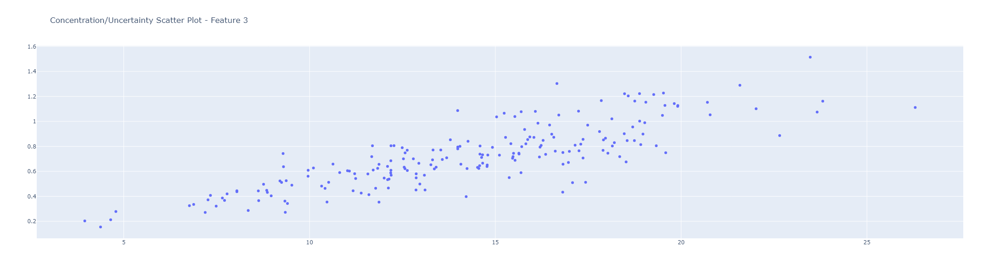

In [9]:
# Concentration / Uncertainty Scatter plot for specific feature, feature/column specified by index
data_handler.plot_data_uncertainty(feature_idx=2)

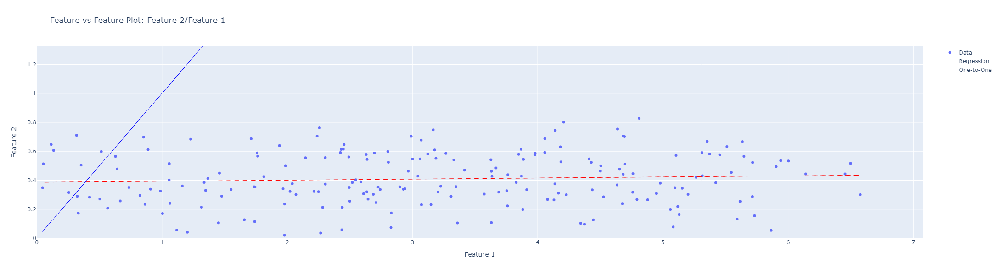

In [10]:
# Species Concentration plot comparing features, features/columns specified by index
data_handler.plot_feature_data(x_idx=0, y_idx=1)

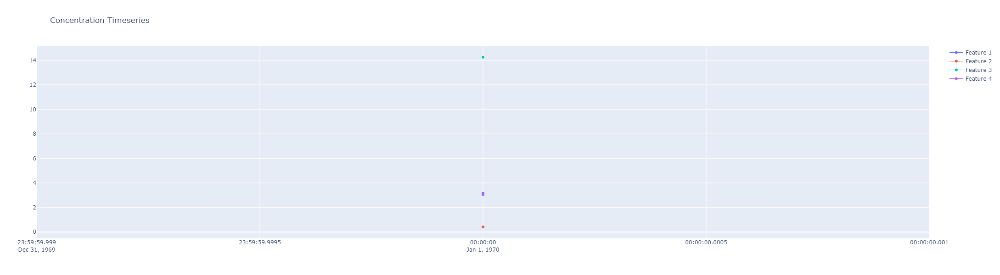

In [11]:
# Species Timeseries, a single or list of features/columns specified by index
data_handler.plot_feature_timeseries(feature_selection=[0, 1, 2, 3])

In [12]:
%%time
# Training multiple models, optional parameters are commented out.
sa_models = BatchSA(V=V, U=U, factors=factors, models=models, method=method, seed=seed, max_iter=max_iterations,
                    init_method=init_method, init_norm=init_norm,
                    converge_delta=converge_delta, converge_n=converge_n, 
                    parallel=parallel, optimized=optimized,
                    verbose=verbose
                   )
_ = sa_models.train()

18-Apr-24 07:56:11 - Model: 1, Q(true): 6255.6907, Q(robust): 6254.6336, Seed: 8925, Converged: True, Steps: 2098/20000
18-Apr-24 07:56:11 - Model: 2, Q(true): 6257.948, Q(robust): 6257.6583, Seed: 77395, Converged: True, Steps: 2104/20000
18-Apr-24 07:56:11 - Model: 3, Q(true): 8374.005, Q(robust): 7045.4048, Seed: 65457, Converged: True, Steps: 2337/20000
18-Apr-24 07:56:11 - Model: 4, Q(true): 6305.1281, Q(robust): 6301.5959, Seed: 43887, Converged: True, Steps: 4479/20000
18-Apr-24 07:56:11 - Model: 5, Q(true): 6273.6468, Q(robust): 6273.3418, Seed: 43301, Converged: True, Steps: 2776/20000
18-Apr-24 07:56:11 - Model: 6, Q(true): 6278.8538, Q(robust): 6278.5527, Seed: 85859, Converged: True, Steps: 2248/20000
18-Apr-24 07:56:11 - Model: 7, Q(true): 6250.3993, Q(robust): 6250.0376, Seed: 8594, Converged: True, Steps: 1998/20000
18-Apr-24 07:56:11 - Model: 8, Q(true): 6258.2368, Q(robust): 6257.8475, Seed: 69736, Converged: True, Steps: 2247/20000
18-Apr-24 07:56:11 - Model: 9, Q(tru

CPU times: total: 125 ms
Wall time: 5.6 s


#### Train Model

In [13]:
# Selet the best performing model to review
best_model = sa_models.best_model
sa_model = sa_models.results[best_model]
best_model

15

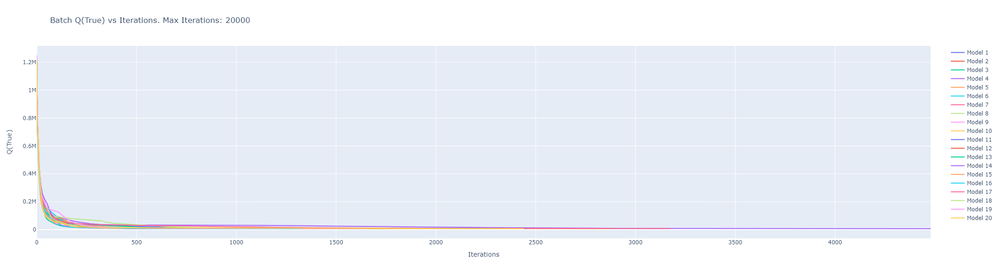

In [14]:
# Perform batch model analysis
batch_analysis = BatchAnalysis(batch_sa=sa_models)
# Plot the loss of the models over iterations
batch_analysis.plot_loss()

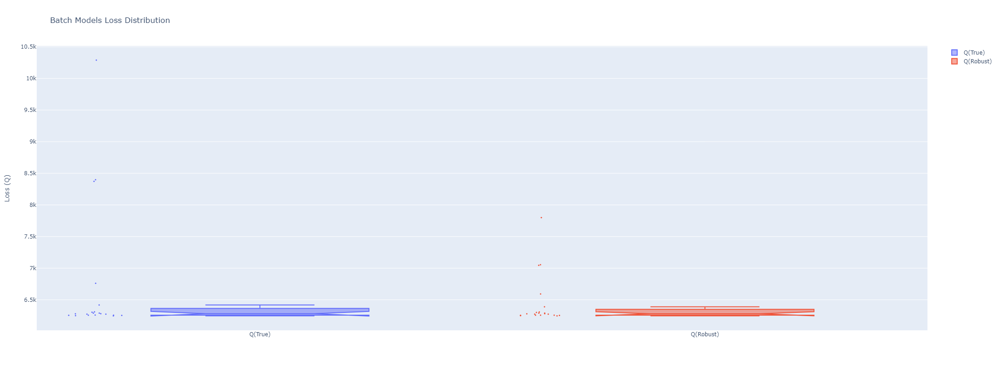

In [15]:
# Plot the loss distribution for the batch models
batch_analysis.plot_loss_distribution()

In [16]:
# Initialize the Model Analysis module
model_analysis = ModelAnalysis(datahandler=data_handler, model=sa_model, selected_model=best_model)

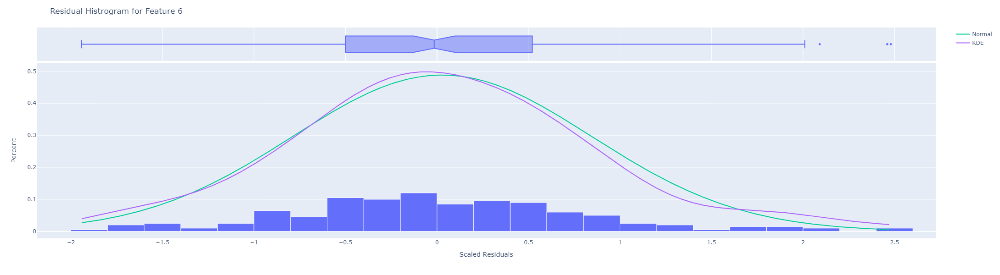

In [17]:
# Residual Analysis shows the scaled residual histogram, along with metrics and distribution curves. The abs_threshold parameter specifies the condition for the returned values of the function call as those residuals which exceed the absolute value of that threshold.
abs_threshold = 3.0
threshold_residuals = model_analysis.plot_residual_histogram(feature_idx=5, abs_threshold=abs_threshold)

In [18]:
print(f"List of Absolute Scaled Residual Greather than: {abs_threshold}. Count: {threshold_residuals.shape[0]}")
threshold_residuals

List of Absolute Scaled Residual Greather than: 3.0. Count: 0


,Feature 6,datetime


In [19]:
# The model output statistics for the estimated V, including SE: Standard Error metrics, and 3 normal distribution tests of the residuals (KS Normal is used in PMF5)
model_analysis.calculate_statistics()
model_analysis.statistics

,Features,Category,r2,Intercept,Intercept SE,Slope,Slope SE,SE,SE Regression,Anderson Normal Residual,Anderson Statistic,Shapiro Normal Residuals,Shapiro PValue,KS Normal Residuals,KS PValue,KS Statistic
0,Feature 1,Strong,0.991519,0.019296,0.023125,0.991216,0.006515,0.010623,0.149541,10.0,0.632204,No,0.011286,Yes,0.841549,0.042803
1,Feature 2,Strong,0.991207,0.003509,0.002964,0.990061,0.006627,0.001191,0.016743,15.0,0.276232,Yes,0.633848,Yes,0.967396,0.034175
2,Feature 3,Strong,0.970818,0.655309,0.172528,0.945517,0.011650,0.049206,0.660366,No,1.460114,No,0.003631,Yes,0.193276,0.075583
3,Feature 4,Strong,0.994824,0.018179,0.018157,0.992505,0.005088,0.009446,0.132867,15.0,0.365664,Yes,0.425453,Yes,0.850501,0.042350
4,Feature 5,Strong,0.982378,0.245087,0.140280,0.978723,0.009316,0.044206,0.617089,10.0,0.613230,Yes,0.251636,Yes,0.456906,0.059682
5,Feature 6,Strong,0.992564,0.017657,0.018180,0.990108,0.006090,0.009411,0.132212,15.0,0.497279,Yes,0.114171,Yes,0.906782,0.039170
6,Feature 7,Strong,0.980214,0.166874,0.091863,0.979395,0.009889,0.028864,0.403789,15.0,0.233947,Yes,0.931362,Yes,0.917666,0.038455
7,Feature 8,Strong,0.985128,0.037390,0.037527,0.988313,0.008630,0.013347,0.187889,15.0,0.373544,Yes,0.657184,Yes,0.635281,0.051885
8,Feature 9,Strong,0.984350,0.250255,0.105118,0.973904,0.008727,0.037565,0.519640,5.0,0.644460,Yes,0.253174,Yes,0.498336,0.057780
9,Feature 10,Strong,0.980202,0.188039,0.146123,0.984761,0.009946,0.044087,0.619817,5.0,0.679593,Yes,0.064725,Yes,0.533796,0.056208


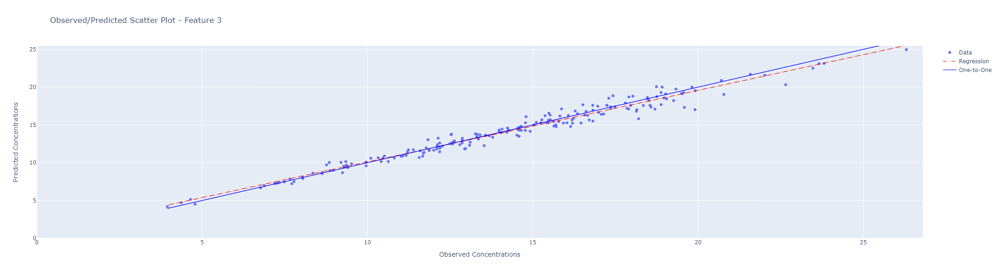

In [20]:
# Model feature observed vs predicted plot with regression and one-to-one lines. Feature/Column specified by index.
model_analysis.plot_estimated_observed(feature_idx=2)

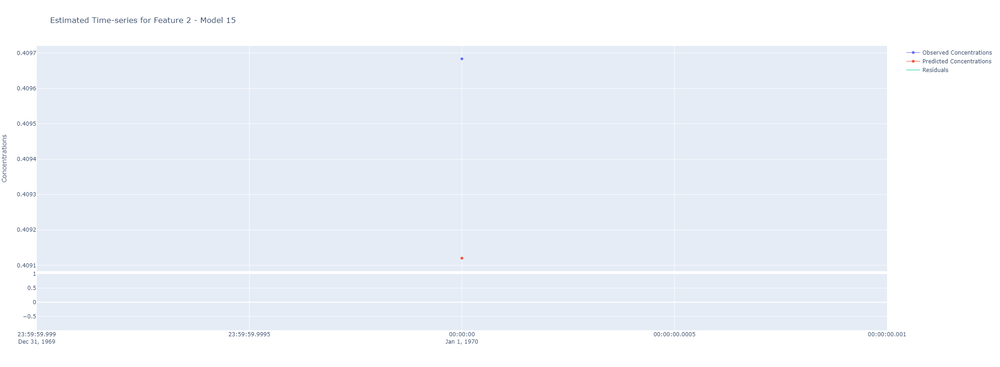

In [21]:
# Model feature timeseries analysis plot showing the observed vs predicted values of the feature, along with the residuals shown below. Feature/column specified by index.
model_analysis.plot_estimated_timeseries(feature_idx=1)

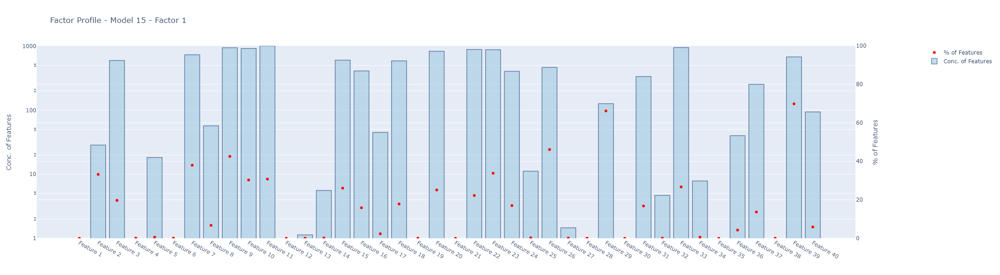

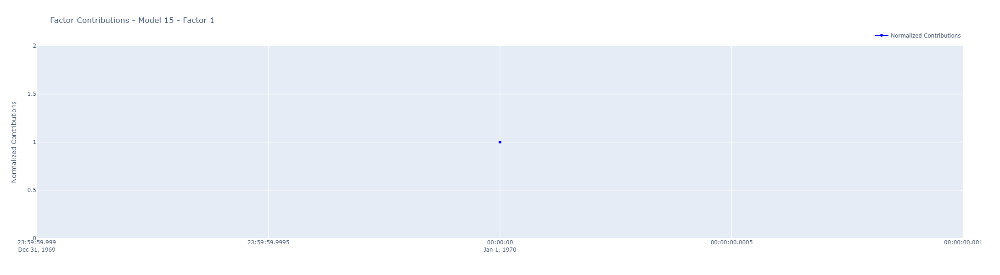

In [22]:
# Factor profile plot showing the factor sum of concentrations by feature (blue bars), the percentage of the feature as the red dot, and in the bottom plot the normalized contributions by date (values are resampled at a daily timestep for timeseries consistency).
# Factor specified by index.
model_analysis.plot_factor_profile(factor_idx=1)

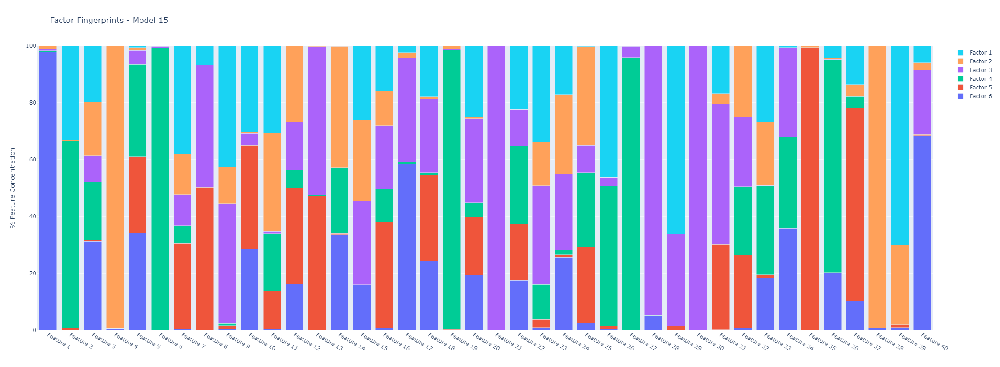

In [23]:
# Model factor fingerprint specifies the feature percentage of each factor.
model_analysis.plot_factor_fingerprints()

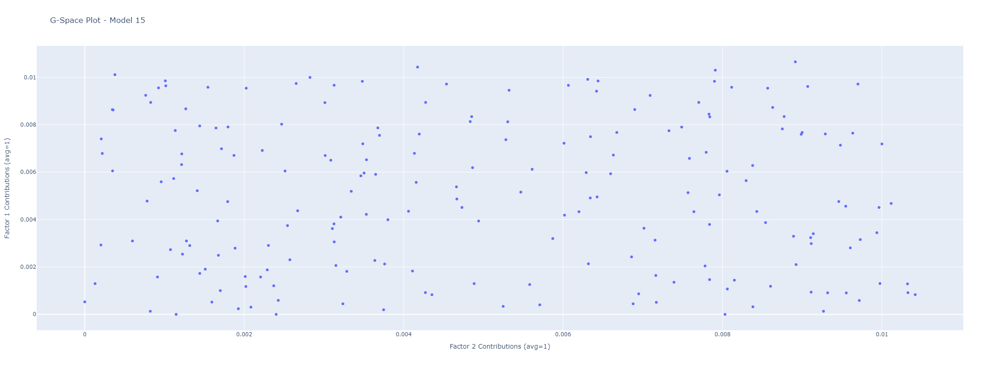

In [24]:
# Factor G-Space plot shows the normalized contributions of one factor vs another factor. Factor specified by index.
model_analysis.plot_g_space(factor_1=2, factor_2=1)

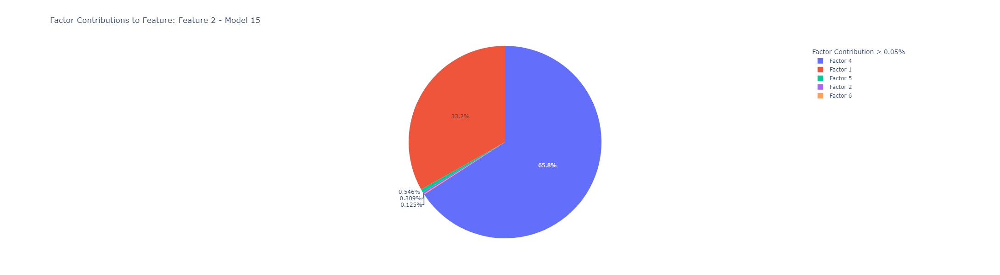

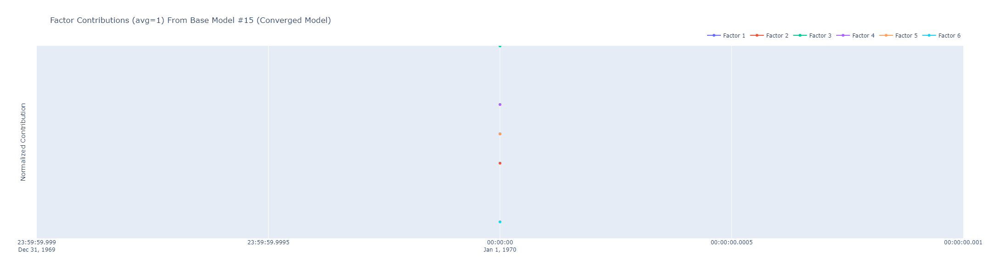

In [25]:
# Factor contribution pie chart shows the percentage of factor contributions for the specified feature, and the corresponding normalized contribution of each factor for that feature (bottom plot). Feature specified by index.
model_analysis.plot_factor_contributions(feature_idx=1)

### Compare to Synthetic Data

Compare the set of batch models to the original synthetic factor data.


In [26]:
from eval.factor_comparison import FactorCompare

In [27]:
factor_comp = FactorCompare(input_df=data_handler.input_data, uncertainty_df=data_handler.uncertainty_data, base_profile_df=syn_profile_df, base_contribution_df=syn_contribution_df, factors_columns=syn_factor_columns, features=syn_columns, batch_sa=sa_models)

In [28]:
factor_comp.compare()

Calculating correlation between factors from each epoch: 100%|█████████████████████████| 20/20 [00:00<00:00, 21.61it/s]


Number of permutations for 6 factors: 720


Calculating average correlation for all permutations for each epoch: 100%|█████████████| 20/20 [01:50<00:00,  5.53s/it]

R2 - Model: 5, Best permutations: ['Factor 6', 'Factor 1', 'Factor 5', 'Factor 2', 'Factor 4', 'Factor 3'], Average R2: 0.9982225403295816, 
Profile R2 Avg: 0.9992195234405846, Contribution R2 Avg: 0.9972212053111575, WH R2 Avg: 0.9982268922370022
Profile R2: [0.99891319338036, 0.9990667760723819, 0.9995352254378692, 0.9990399446887729, 0.9994730892687568, 0.999288911795367], 
Contribution R2: [0.9966067866098051, 0.9975031007833476, 0.9984705573518217, 0.9958635433512891, 0.996498896596472, 0.9983843471742101], 
WH R2: [0.9976705876565654, 0.9982412645560126, 0.9989807839871256, 0.9977374921051286, 0.9978963409804497, 0.9988348841367314]

Base Q(true): 77.60602239262407, SA Model 5 Q(true): 6273.646841452666


In [29]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

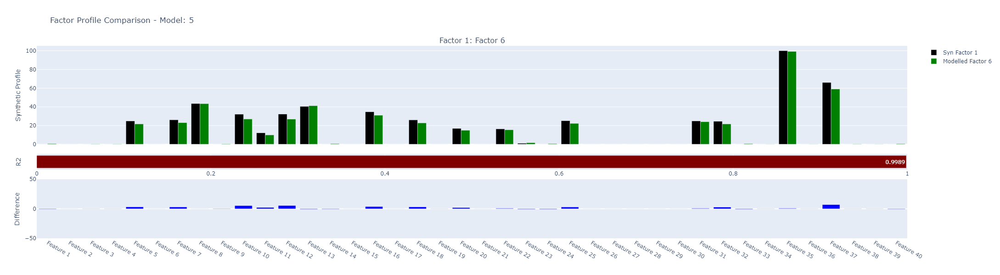

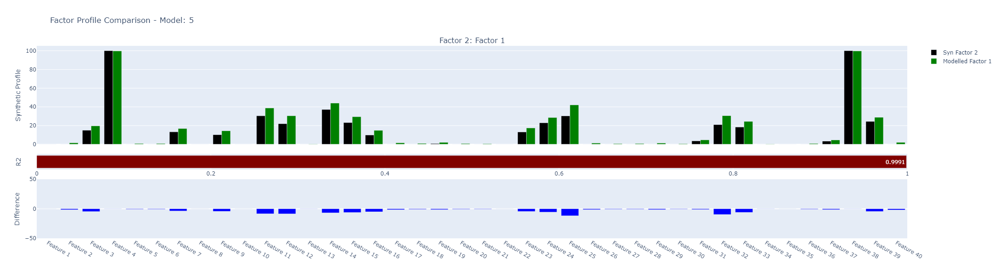

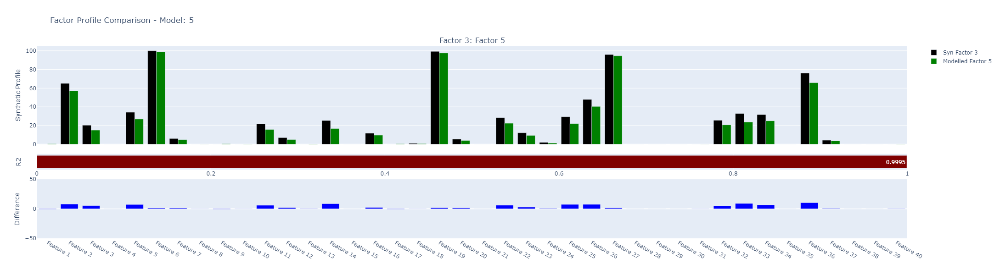

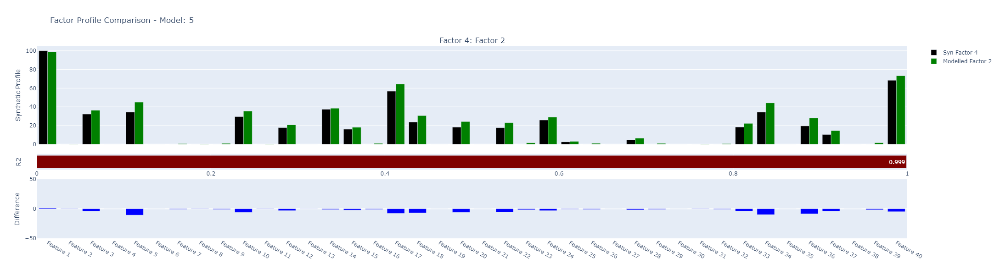

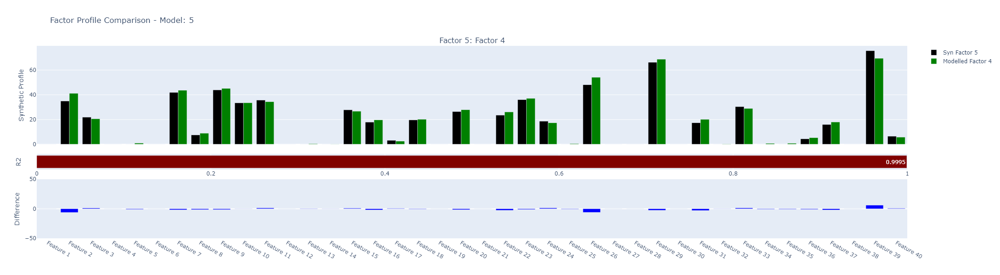

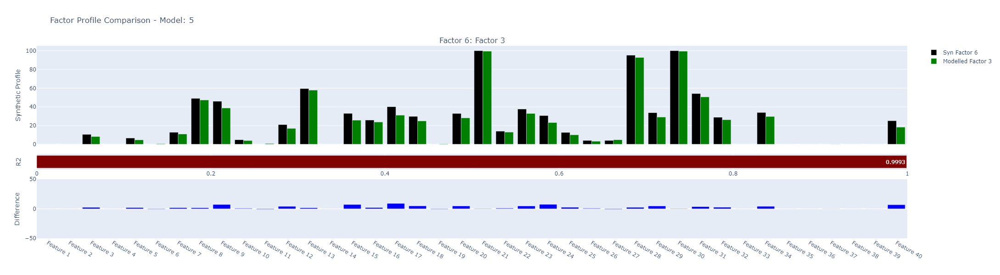

In [208]:
color_map = px.colors.sample_colorscale("plasma", [n/(factors -1) for n in range(factors)])
r_color_map = px.colors.sample_colorscale("jet", [n/(100 -1) for n in range(100)])

c_model = sa_models.results[factor_comp.best_model]
syn_H = syn_factor_profiles
norm_syn_H = 100 * (syn_H / syn_H.sum(axis=0))

_H = sa_models.results[factor_comp.best_model].H
norm_H = 100 * (_H / _H.sum(axis=0))
subplot_titles = [f"Factor {i}: {factor_comp.factor_map[i-1]}" for i in range(1, factors+1)]

# h_fig = make_subplots(rows=3, cols=factors, vertical_spacing=0.03, subplot_titles=subplot_titles, row_heights=[0.50, 0.04, 0.31])
for i in range(1, factors+1):
    label = (subplot_titles[i-1], "", "")
    h_fig = make_subplots(rows=3, cols=1, vertical_spacing=0.05, subplot_titles=label, row_heights=[0.5, 0.08, 0.3])

    h_fig.add_trace(go.Bar(name=f"Syn Factor {i}", x=data_handler.features, y=norm_syn_H[i-1], marker_color="black"), row=1, col=1)
    map_i = int(factor_comp.factor_map[i-1].split(" ")[1]) - 1
    h_fig.add_trace(go.Bar(name=f"Modelled {factor_comp.factor_map[i-1]}", x=data_handler.features, y=norm_H[map_i], marker_color="green"), row=1, col=1)
    i_r2 = factor_comp.best_factor_r[i-1]
    h_fig.add_trace(go.Bar(name="R2", x=(i_r2,), orientation='h', marker_color=r_color_map[int(100*i_r2)], text=np.round(i_r2,4), textposition="inside", hoverinfo='text', hovertemplate="R2: %{x:4f}<extra></extra>", showlegend=False), row=2, col=1)
    h_fig.add_trace(go.Bar(name="", x=data_handler.features, y=norm_syn_H[i-1]- norm_H[map_i], marker_color="blue", showlegend=False), row=3, col=1)
    h_fig.update_yaxes(title_text="Synthetic Profile", row=1, col=1, title_standoff=3)
    # h_fig.update_yaxes(title_text="Model Profile", row=2, col=1, title_standoff=3)
    h_fig.update_yaxes(title_text="R2", row=2, col=1, title_standoff=25)
    h_fig.update_yaxes(title_text="Difference", row=3, col=1, title_standoff=3)
    h_fig.update_xaxes(row=1, showticklabels=False)
    # h_fig.update_xaxes(row=2, showticklabels=False)
    h_fig.update_xaxes(row=2, range=[0, 1.0])
    h_fig.update_yaxes(row=2, showticklabels=False)
    h_fig.update_yaxes(row=3, range=[-50, 50])
    h_fig.update_layout(title_text=f"Factor Profile Comparison - Model: {factor_comp.best_model+1}", width=1000, height=600, hovermode='x', showlegend=True)
    h_fig.show()

In [ ]:
syn_H = syn_factor_profiles
syn_W = syn_factor_contributions

_H = sa_models.results[factor_comp.best_model].H
_W = sa_models.results[factor_comp.best_model].W

syn_matrices = []
pred_matrices = []
for f in range(factors):
    f_sW = syn_W[:, f]
    f_sW = np.reshape(f_sW, (len(f_sW), 1))
    f_sH = [syn_H[f]]
    f_sWH = np.matmul(f_sW, f_sH)
    syn_matrices.append(f_sWH)

    f_pW = _W[:, f]
    f_pW = np.reshape(f_pW, (len(f_pW), 1))
    f_pH = [_H[f]]
    f_pWH = np.matmul(f_pW, f_pH)
    pred_matrices.append(f_pWH)

In [99]:
x = list(syn_input_df.index)
y = list(syn_input_df.columns)

In [178]:
factor_i = 3
feature_i = 1
syn_i = syn_matrices[factor_i][:,feature_i] / syn_matrices[factor_i][:,feature_i].sum()
pred_i = pred_matrices[factor_i][:,feature_i] / pred_matrices[factor_i][:,feature_i].sum()
residual_i = syn_i - pred_i
y_max = max(np.max(syn_matrices[factor_i]), np.max(pred_matrices[factor_i]))

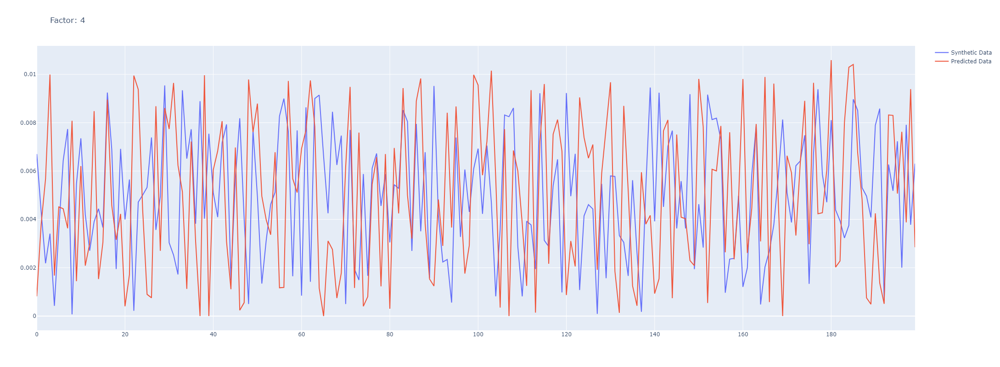

In [179]:
conc_fig = go.Figure()
conc_fig.add_trace(go.Scatter(x=x, y=syn_i, name="Synthetic Data"))
conc_fig.add_trace(go.Scatter(x=x, y=pred_i, name="Predicted Data"))
# conc_fig.add_trace(go.Scatter(x=x, y=residual_i, name="Residuals"))
conc_fig.update_layout(width=1200, height=800, title_text=f"Factor: {factor_i+1}", hovermode='x unified')
conc_fig.show()